<img src="https://github.com/Christina1281995/demo-repo/blob/main/final_assignment_header.png?raw=true">

## Description

This project performs a complete (beginning to end) geospatial and semantic analysis of social media data. The methodology used has many real-world application contexts.

In general, the work is structured as follows:

> In <b>Task 1</b>, CSV data is accessed and some preprocessing is performed to prepare the data for geospatial and semantic analysis.

> In <b>Task 2</b> a model from the hugging face platform is chosen for the semantic analysis and  the results are added to the dataset using the <b>pipeline</b> approach.

> After that, in <b>Task 3</b> the analysis results are plotted and a basic <b>geospatial analysis</b> is performed on the results of the <b>semantic analysis</b>.

> <b>Task 4</b> consists of the main interpretation/discussion of the analysis.

<br>

#### <b>The Topic</b>

The topic of this analysis is the twitter "takeover" by Elon Musk in October 2022. This acquisition has had a strong impact on the employees, functionality, and discourse on Twitter. In this final assignment, the public opinions on this acquisition are of interest, especially those of the users of the platform.

<br>

#### <b>The Data</b>

The data used in this assignment is Twitter data. The dataset contains tweets that were posted from within the US, between the 1st of October and the 23rd of November 2022, and contain keywords such as "elon musk", "elon", "musk", "#elonmusk", "#elon" and "twitter".

## Analysis

### Environment Setup

The first step is to customize the Google Colab environment so that it contains all the functionalities needed for the analysis.

In [ ]:
# Install transformers and sentencepiece to avoid an error later on
!pip install --no-cache-dir transformers sentencepiece

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 55.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 119.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 186.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 88.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 128.4 MB/s eta 0:00:00


In [ ]:
# Install the required packages into the environment
!pip install torch geopandas plpygis shapely plotly seaborn wordcloud contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 62.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 kB 8.9 MB/s eta 0:00:00


In [ ]:
# Import the required packages


# ------------- General Data Handling ---------------------------------

import numpy as np                                                     # The fundamental package for scientific computing with Python
from scipy.special import softmax                                      # Fundamental algorithms for scientific computing in Python
import csv                                                             # A python 3 CSV module for handling CSV data
import urllib.request                                                  # HTTP library with thread-safe connection pooling, file post, and more
import pandas as pd                                                    # Powerful data structures for data analysis, time series, and statistics
import xml.etree.cElementTree as ET                                    # XPath 1.0/2.0 parsers and selectors for ElementTree (for loading XML datafiles)


# ------------- NLP/ Deep Learning Libraries ---------------------------

import torch                                                           # PyTorch is an optimized tensor library for deep learning using GPUs and CPUs
from transformers import AutoModelForSequenceClassification            # State-of-the-art Natural Language Processing for TensorFlow 2.0 and PyTorch
from transformers import TFAutoModelForSequenceClassification          # State-of-the-art Natural Language Processing for TensorFlow 2.0 and PyTorch
from transformers import AutoTokenizer, AutoConfig                     # State-of-the-art Natural Language Processing for TensorFlow 2.0 and PyTorch


# ------------- Plotting Data ------------------------------------------

import matplotlib.pyplot as plt                                        # Publication quality figures in Python
%matplotlib inline
import plotly                                                          # An open-source, interactive data visualisation library
import plotly.express as px                                            # An open-source, interactive data visualisation library
import seaborn as sns; sns.set(style="ticks", color_codes=True)        # Statistical data visualization
import contextily                                                      # Context geo-tiles in Python
from wordcloud import WordCloud                                        # A python wordcloud generator
from wordcloud import ImageColorGenerator                              # A python wordcloud generator
from wordcloud import STOPWORDS                                        # A python wordcloud generator
from PIL import Image                                                  # for masking wordcloud with an image
import requests                                                        # for accessing url image
from io import BytesIO                                                 # for accedssing url image


# ------------- Geographic/ Mapping Libraries --------------------------

import geopandas as gpd                                                # Geographic pandas extension
import folium                                                          # Make beautiful maps with Leaflet.js and Python
import folium.plugins as plugins                                       # Make beautiful maps with Leaflet.js and Python
import plpygis                                                         # A converter to and from the PostGIS geometry types, WKB, GeoJSON and Shapely formats
from plpygis import Geometry                                           # A converter to and from the PostGIS geometry types, WKB, GeoJSON and Shapely formats
from shapely.geometry import Point, Polygon, shape                     # creating geospatial data
from shapely import wkb, wkt                                           # creating and parsing geospatial data
import shapely                                                         # Manipulation and analysis of geometric objects in the Cartesian plane


### Task 1: Data Preparation

To get started with any kind of geospatial analysis of textual data, the data will need to be imported and prepared.

##### 1. Get the data

<img src="https://www.fsdbco.com/wp-content/uploads/2018/12/cropped-data-quality-reference-data-icon.png" align='right' width='20%'>

There are several ways to get data for analysis - either through "crawling" (= collecting) the data or getting data someone else has already collected. In this case a prepared [CSV file](https://drive.google.com/file/d/1hHkde7xSGNlemYRw6yFFj5RfRfAGbFHS/view?usp=share_link) containing a lot of tweets (nearly 100000) is used.

##### 2. Load the data into a pandas DataFrame

To start working with the data, it is loaded into this notebook using the pandas <u>[```.read_csv()```](https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html)</u> function.

In [ ]:
# Load the CSV data into a pandas dataframe called "data"

data = pd.read_csv('twitter_us_csv.csv', encoding = 'latin1')
data


,message_id,date,text,tags,tweet_lang,source,place,geom,retweets,tweet_favorites,...,user_lang,latitude,longitude,data_source,keywords,sentiment,county_id,tweet_integer,tweet_positive,tweet_negative
0,1.581730e+18,16/10/2022 19:19,@mizzboothang78 @masikakalysha @Twitter You're...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.4168716 37.883347, -121.183979 ...",0,0,...,NaN,NaN,NaN,[1],True,positive,2359,1,1.0,NaN
1,1.576230e+18,01/10/2022 15:26,Good morning.Saturday twitter https://t.co/P5Y...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,NaN,[3],True,positive,2359,1,1.0,NaN
2,1.590350e+18,09/11/2022 14:11,Good morning.twitter https://t.co/oI5TIsYR3V,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,NaN,[3],True,positive,2359,1,1.0,NaN
3,1.590420e+18,09/11/2022 18:49,@Shiba_King1991 @elonmusk So much knowledge he...,NaN,en,"<a href=""http://twitter.com/download/iphone"" r...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,NaN,[3],True,positive,2359,1,1.0,NaN
4,1.578560e+18,08/10/2022 01:17,Shabbat Shalom Mijo. Shabbat Shalom Twitter Fr...,HerVoiceMatters,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,NaN,[3],True,positive,2359,1,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97657,1.590390e+18,09/11/2022 16:46,@elonmusk Twitter blue future looks good,NaN,en,"<a href=""http://twitter.com/download/iphone"" r...","San Dimas, CA","POLYGON ((-117.854065 34.063734, -117.854065 3...",0,0,...,NaN,NaN,NaN,[3],True,positive,2466,1,1.0,NaN
97658,1.587890e+18,02/11/2022 19:12,Elon gotta be from another planet or somthing ...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","San Dimas, CA","POLYGON ((-117.854065 34.063734, -117.854065 3...",0,0,...,NaN,NaN,NaN,[3],True,positive,2466,1,1.0,NaN
97659,1.593340e+18,17/11/2022 20:07,@ThisIsKyleR @elonmusk @Twitter unbelievable,NaN,en,"<a href=""http://twitter.com/download/iphone"" r...","Glendora, CA","POLYGON ((-117.890263 34.10549, -117.890263 34...",0,0,...,NaN,NaN,NaN,[3],True,positive,2466,1,1.0,NaN
97660,1.579660e+18,11/10/2022 02:12,Do you remember when you joined Twitter? I do!...,MyTwitterAnniversary,en,"<a href=""http://twitter.com/download/iphone"" r...","Covina, CA","POLYGON ((-117.927041 34.068114, -117.836898 3...",0,0,...,NaN,NaN,NaN,[1],True,positive,2466,1,1.0,NaN


##### 3. Take a first look at the data

In [ ]:
# Check how large the dataset is
len(data)

97662

In [ ]:
# Check what columns are included in the dataset
for col in data.columns:
    print(col)

message_id
date
text
tags
tweet_lang
source
place
geom
retweets
tweet_favorites
photo_url
quoted_status_id
user_id
user_name
user_location
followers
friends
user_favorites
status
user_lang
latitude
longitude
data_source
keywords
sentiment
county_id
tweet_integer
tweet_positive
tweet_negative


In [ ]:
# Check the datatypes for each of the columns
data.dtypes

message_id          float64
date                 object
text                 object
tags                 object
tweet_lang           object
source               object
place                object
geom                 object
retweets              int64
tweet_favorites       int64
photo_url            object
quoted_status_id    float64
user_id             float64
user_name            object
user_location        object
followers             int64
friends               int64
user_favorites        int64
status                int64
user_lang           float64
latitude            float64
longitude           float64
data_source          object
keywords               bool
sentiment            object
county_id             int64
tweet_integer         int64
tweet_positive      float64
tweet_negative      float64
dtype: object

##### 4. Create a geodataframe

This is a crucial part of the data preparation: To do any geospatial analyses, the DataFrame needs to be converted into a [<b>GeoDataFrame</b>](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.html).

In [ ]:
# Display the "geom" value in the first row of the dataset
data.loc[0,'geom']

'POLYGON ((-121.4168716 37.883347, -121.183979 37.883347, -121.183979 38.078305, -121.4168716 38.078305, -121.4168716 37.883347))'

This is a representation of a polygon using the <b>Well-Known Text (WKT)</b> format. WKT is a text-based representation of geometry objects, defined by the Open Geospatial Consortium (OGC).

There are two key steps involved in the conversion of this text-based representation to an actual geometry data type:
1. Convert the WKT strings into shapely objects. This is done by using the shapely <u>[```.apply(wkt.loads)```](https://shapely.readthedocs.io/en/stable/manual.html#shapely.wkt.loads)</u> function on the "geom" column.
2. Use the ```GeoDataFrame``` constructor from the ```geopandas``` library to create a geodataframe.

In [ ]:
# Convert the 'geom' column to shapely objects and store them in a new column called 'geometry'
data['geometry'] = data['geom'].apply(wkt.loads)
#data.head()

# Create a geodataframe called 'geodata' from the pandas dataframe
geodata = gpd.GeoDataFrame(data, crs="EPSG:4326")
geodata.head()

,message_id,date,text,tags,tweet_lang,source,place,geom,retweets,tweet_favorites,...,latitude,longitude,data_source,keywords,sentiment,county_id,tweet_integer,tweet_positive,tweet_negative,geometry
0,1.581730e+18,16/10/2022 19:19,@mizzboothang78 @masikakalysha @Twitter You're...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.4168716 37.883347, -121.183979 ...",0,0,...,NaN,NaN,[1],True,positive,2359,1,1.0,NaN,"POLYGON ((-121.41687 37.88335, -121.18398 37.8..."
1,1.576230e+18,01/10/2022 15:26,Good morning.Saturday twitter https://t.co/P5Y...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,[3],True,positive,2359,1,1.0,NaN,"POLYGON ((-121.41687 37.88335, -121.41687 38.0..."
2,1.590350e+18,09/11/2022 14:11,Good morning.twitter https://t.co/oI5TIsYR3V,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,[3],True,positive,2359,1,1.0,NaN,"POLYGON ((-121.41687 37.88335, -121.41687 38.0..."
3,1.590420e+18,09/11/2022 18:49,@Shiba_King1991 @elonmusk So much knowledge he...,NaN,en,"<a href=""http://twitter.com/download/iphone"" r...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,[3],True,positive,2359,1,1.0,NaN,"POLYGON ((-121.41687 37.88335, -121.41687 38.0..."
4,1.578560e+18,08/10/2022 01:17,Shabbat Shalom Mijo. Shabbat Shalom Twitter Fr...,HerVoiceMatters,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,NaN,[3],True,positive,2359,1,1.0,NaN,"POLYGON ((-121.41687 37.88335, -121.41687 38.0..."


In [ ]:
# Print out what types of geometries are contained in the dataset and how many of each
print(geodata.geom_type.value_counts())

Polygon    96509
Point       1153
dtype: int64


In [ ]:
for i in range(0, 10):
  print(geodata.loc[i, 'geometry'])

POLYGON ((-121.4168716 37.883347, -121.183979 37.883347, -121.183979 38.078305, -121.4168716 38.078305, -121.4168716 37.883347))
POLYGON ((-121.416872 37.883347, -121.416872 38.078305, -121.183979 38.078305, -121.183979 37.883347, -121.416872 37.883347))
POLYGON ((-121.416872 37.883347, -121.416872 38.078305, -121.183979 38.078305, -121.183979 37.883347, -121.416872 37.883347))
POLYGON ((-121.416872 37.883347, -121.416872 38.078305, -121.183979 38.078305, -121.183979 37.883347, -121.416872 37.883347))
POLYGON ((-121.416872 37.883347, -121.416872 38.078305, -121.183979 38.078305, -121.183979 37.883347, -121.416872 37.883347))
POLYGON ((-121.416872 37.883347, -121.416872 38.078305, -121.183979 38.078305, -121.183979 37.883347, -121.416872 37.883347))
POLYGON ((-121.416872 37.883347, -121.416872 38.078305, -121.183979 38.078305, -121.183979 37.883347, -121.416872 37.883347))
POLYGON ((-121.416872 37.883347, -121.416872 38.078305, -121.183979 38.078305, -121.183979 37.883347, -121.416872 3

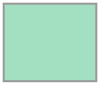

In [ ]:
geodata.loc[0, 'geometry']

The dataset contains 96509 polygon (squares of the same size) and 1153 point data-types. Using point data makes a lot of sense since a tweet is tweeted at a certain time at a certain location on the planet. However, most of the data is polygons (>90%). As shown in the cell above, the polygons are rectangles. This may be due to imprecise GPS coordinates of the locations, due to which bounding boxes are created. Another possibility would be that positions are located with the help of grid cells and the coordinates of that grid cell are then returned. This could be done for simplicity or due to privacy.

From a spatial analysis point of view, the more useful geometry would be the point datatype and not polygons. It is easier to interpret (1 Person sends 1 tweet at 1 location at 1 point in time). Also, point data avoids having to deal with partially overlapping polygons or other spatial relations. This makes point data easier to deal with in our use case.

Next all polygons are transformed into points, where the new point is the polygon's centroid.

In [ ]:
# Create a new column called "geom_type" which shows whether the data is a point or polygon
geodata['geom_type'] = geodata['geometry'].apply(lambda x: x.geom_type)

In [ ]:
geodata.head(1)

,message_id,date,text,tags,tweet_lang,source,place,geom,retweets,tweet_favorites,...,longitude,data_source,keywords,sentiment,county_id,tweet_integer,tweet_positive,tweet_negative,geometry,geom_type
0,1.581730e+18,16/10/2022 19:19,@mizzboothang78 @masikakalysha @Twitter You're...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.4168716 37.883347, -121.183979 ...",0,0,...,NaN,[1],True,positive,2359,1,1.0,NaN,"POLYGON ((-121.41687 37.88335, -121.18398 37.8...",Polygon


In [ ]:
a = 0
for row in range(0, len(geodata)-1):
  a = a+1

a

97661

In [ ]:
# Iterate over each row in the geodataframe using a for-loop
for row in range(0, len(geodata)-1):

    # If-condition to check if the row['geom_type'] is a Polygon
    if (geodata.at[row, 'geom_type'] == 'Polygon'):

        # Get the centroid of the polygon
        centroid = geodata.at[row, 'geometry'].centroid

        # Create a new Point geometry from the centroid
        point_geom = centroid

        # Update the geometry of the row with the new Point geometry
        geodata.at[row, 'geometry'] = point_geom

        # Update the geom_type of the row to 'Point'
        geodata.at[row, 'geom_type'] = 'Point'




In [ ]:
geodata.head(5)

,message_id,date,text,tags,tweet_lang,source,place,geom,retweets,tweet_favorites,...,longitude,data_source,keywords,sentiment,county_id,tweet_integer,tweet_positive,tweet_negative,geometry,geom_type
0,1.581730e+18,16/10/2022 19:19,@mizzboothang78 @masikakalysha @Twitter You're...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.4168716 37.883347, -121.183979 ...",0,0,...,NaN,[1],True,positive,2359,1,1.0,NaN,POINT (-121.30043 37.98083),Point
1,1.576230e+18,01/10/2022 15:26,Good morning.Saturday twitter https://t.co/P5Y...,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,[3],True,positive,2359,1,1.0,NaN,POINT (-121.30043 37.98083),Point
2,1.590350e+18,09/11/2022 14:11,Good morning.twitter https://t.co/oI5TIsYR3V,NaN,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,[3],True,positive,2359,1,1.0,NaN,POINT (-121.30043 37.98083),Point
3,1.590420e+18,09/11/2022 18:49,@Shiba_King1991 @elonmusk So much knowledge he...,NaN,en,"<a href=""http://twitter.com/download/iphone"" r...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,[3],True,positive,2359,1,1.0,NaN,POINT (-121.30043 37.98083),Point
4,1.578560e+18,08/10/2022 01:17,Shabbat Shalom Mijo. Shabbat Shalom Twitter Fr...,HerVoiceMatters,en,"<a href=""http://twitter.com/download/android"" ...","Stockton, CA","POLYGON ((-121.416872 37.883347, -121.416872 3...",0,0,...,NaN,[3],True,positive,2359,1,1.0,NaN,POINT (-121.30043 37.98083),Point


In [ ]:
# Check the geometry types again to make sure all were successfully converted
print(geodata.geom_type.value_counts())

Point    97662
dtype: int64


In [ ]:
geodata.dtypes

message_id           float64
date                  object
text                  object
tags                  object
tweet_lang            object
source                object
place                 object
geom                  object
retweets               int64
tweet_favorites        int64
photo_url             object
quoted_status_id     float64
user_id              float64
user_name             object
user_location         object
followers              int64
friends                int64
user_favorites         int64
status                 int64
user_lang            float64
latitude             float64
longitude            float64
data_source           object
keywords                bool
sentiment             object
county_id              int64
tweet_integer          int64
tweet_positive       float64
tweet_negative       float64
geometry            geometry
geom_type             object
dtype: object

##### 5. Filter the data by relevant columns

In [ ]:
# Create a new dataframe (or a copy of the original one) with only the relevant columns
geodata_subset = geodata.filter(items = ['date', 'text', 'sentiment' ,'geometry', 'tweet_lang', 'user_id', 'followers'])
geodata_subset.head(10)

,date,text,sentiment,geometry,tweet_lang,user_id,followers
0,16/10/2022 19:19,@mizzboothang78 @masikakalysha @Twitter You're...,positive,POINT (-121.30043 37.98083),en,1.391820e+18,347
1,01/10/2022 15:26,Good morning.Saturday twitter https://t.co/P5Y...,positive,POINT (-121.30043 37.98083),en,1.299090e+18,18
2,09/11/2022 14:11,Good morning.twitter https://t.co/oI5TIsYR3V,positive,POINT (-121.30043 37.98083),en,1.299090e+18,17
3,09/11/2022 18:49,@Shiba_King1991 @elonmusk So much knowledge he...,positive,POINT (-121.30043 37.98083),en,1.460280e+18,1834
4,08/10/2022 01:17,Shabbat Shalom Mijo. Shabbat Shalom Twitter Fr...,positive,POINT (-121.30043 37.98083),en,1.447260e+18,887
5,13/11/2022 18:25,Football ?? My daughter/Cat ?? Life is guud ??...,positive,POINT (-121.30043 37.98083),en,1.460280e+18,1821
6,15/11/2022 01:20,"@SNFRules Thanks Terry, I appreciate your insi...",positive,POINT (-121.30043 37.98083),en,4.876687e+09,248
7,11/10/2022 00:09,Happy Monday yall come and kick it with @_rac...,positive,POINT (-121.30043 37.98083),en,1.460280e+18,1741
8,19/10/2022 18:04,Good morning.Twitter https://t.co/f5sZZ2F9Sg,positive,POINT (-121.30043 37.98083),en,1.299090e+18,16
9,10/11/2022 03:55,@RyanZohoury @teslaownersSV @Twitter @elonmusk...,positive,POINT (-121.28477 37.87637),en,1.214690e+18,5827


##### 6. Filter the data by location

<img src="https://github.com/Christina1281995/demo-repo/blob/main/states.png?raw=true" align="right" width='50%'>

The last preparation step is to spatially filter the data. The two states of California and New York are chosen as areas of interests. All other states are filtered out, using a Shapefile of US state boundaries.

In [ ]:
# Read the Shapefile of boundaries of US states into a new variable named 'states'
states = gpd.read_file('/content/states/statesp020.shp')
states.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [ ]:
# Reproject 'states' to the common CRS
states = states.to_crs('EPSG:4326')
states.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
states.head()

,AREA,PERIMETER,STATESP020,STATE,STATE_FIPS,ORDER_ADM,MONTH_ADM,DAY_ADM,YEAR_ADM,geometry
0,267.357,374.768,2,Alaska,02,49,January,3,1959,"POLYGON ((-157.47343 70.95909, -157.46252 70.9..."
1,0.000,0.224,3,Alaska,02,49,January,3,1959,"POLYGON ((-156.00403 71.32314, -156.00696 71.3..."
2,0.000,0.118,4,Alaska,02,49,January,3,1959,"POLYGON ((-155.64453 71.24540, -155.65010 71.2..."
3,0.000,0.276,5,Alaska,02,49,January,3,1959,"POLYGON ((-155.44296 71.21398, -155.46722 71.2..."
4,0.000,0.167,6,Alaska,02,49,January,3,1959,"POLYGON ((-155.16142 71.17490, -155.17613 71.1..."


In [ ]:
# have a look at all states of the US
states.STATE.unique()

array(['Alaska', 'Minnesota', 'Washington', 'Montana', 'Idaho',
       'North Dakota', 'Michigan', 'Maine', 'Wisconsin', 'Oregon',
       'South Dakota', 'New Hampshire', 'New York', 'Vermont', 'Wyoming',
       'Iowa', 'Nebraska', 'Massachusetts', 'Pennsylvania', 'Illinois',
       'Ohio', 'Connecticut', 'Rhode Island', 'California', 'Utah',
       'Nevada', 'Indiana', 'New Jersey', 'Colorado', 'West Virginia',
       'Missouri', 'Kansas', 'Delaware', 'Maryland', 'Virginia',
       'Kentucky', 'District of Columbia', 'Arizona', 'Oklahoma',
       'New Mexico', 'Tennessee', 'North Carolina', 'Texas', 'Arkansas',
       'South Carolina', 'Alabama', 'Georgia', 'Mississippi', 'Louisiana',
       'Florida', 'Hawaii', 'Puerto Rico', 'U.S. Virgin Islands'],
      dtype=object)

In [ ]:
# Filter the states dataset down to only the AOI
California = states[states['STATE'] == 'California']
New_York = states[states['STATE'] == 'New York']

In [ ]:
California.head(5)

,AREA,PERIMETER,STATESP020,STATE,STATE_FIPS,ORDER_ADM,MONTH_ADM,DAY_ADM,YEAR_ADM,geometry
1728,41.544,47.247,1730,California,06,31,September,9,1850,"POLYGON ((-124.21202 41.99972, -124.18295 41.9..."
1769,0.000,0.050,1771,California,06,31,September,9,1850,"POLYGON ((-124.16661 40.81082, -124.17129 40.8..."
1826,0.000,0.065,1828,California,06,31,September,9,1850,"POLYGON ((-121.71442 38.08791, -121.71613 38.0..."
1827,0.000,0.106,1829,California,06,31,September,9,1850,"POLYGON ((-122.00321 38.08326, -122.00195 38.0..."
1830,0.001,0.210,1832,California,06,31,September,9,1850,"POLYGON ((-121.81394 38.03484, -121.80918 38.0..."


In [ ]:
# Filter your geodataframe by states
gdf_California = gpd.overlay(geodata_subset, California, how = 'intersection')
gdf_New_York = gpd.overlay(geodata_subset, New_York, how = 'intersection')

In [ ]:
# Print out information about how large the original dataset is vs. the filtered dataset
print(f"Original dataset size: {len(geodata)}")
print(f"dataset size for California: {len(gdf_California)}")
print(f"dataset size for New York: {len(gdf_New_York)}")

Original dataset size: 97662
dataset size for California: 16604
dataset size for New York: 6210


In [ ]:
# View the "head" of the filtered geodataframe
gdf_California.head()

,date,text,sentiment,tweet_lang,user_id,followers,AREA,PERIMETER,STATESP020,STATE,STATE_FIPS,ORDER_ADM,MONTH_ADM,DAY_ADM,YEAR_ADM,geometry
0,16/10/2022 19:19,@mizzboothang78 @masikakalysha @Twitter You're...,positive,en,1.391820e+18,347,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083)
1,01/10/2022 15:26,Good morning.Saturday twitter https://t.co/P5Y...,positive,en,1.299090e+18,18,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083)
2,09/11/2022 14:11,Good morning.twitter https://t.co/oI5TIsYR3V,positive,en,1.299090e+18,17,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083)
3,09/11/2022 18:49,@Shiba_King1991 @elonmusk So much knowledge he...,positive,en,1.460280e+18,1834,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083)
4,08/10/2022 01:17,Shabbat Shalom Mijo. Shabbat Shalom Twitter Fr...,positive,en,1.447260e+18,887,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083)


In [ ]:
gdf_New_York.head()

,date,text,sentiment,tweet_lang,user_id,followers,AREA,PERIMETER,STATESP020,STATE,STATE_FIPS,ORDER_ADM,MONTH_ADM,DAY_ADM,YEAR_ADM,geometry
0,16/10/2022 22:02,...the best part of TWITTER....,positive,en,2.657061e+09,1226,13.457,23.943,1527,New York,36,11,July,26,1788,POINT (-74.03591 41.13090)
1,09/11/2022 01:49,lmaooo ayo Twitter undefeated ??,positive,en,4.498411e+08,2149,13.457,23.943,1527,New York,36,11,July,26,1788,POINT (-77.71257 43.16266)
2,04/11/2022 13:51,Definitely the most considerate yam on Twitter...,positive,en,1.174800e+18,70,13.457,23.943,1527,New York,36,11,July,26,1788,POINT (-77.99206 42.97688)
3,18/11/2022 12:45,This is viral if I have ever scene a viral twe...,positive,en,2.934277e+08,1245,13.457,23.943,1527,New York,36,11,July,26,1788,POINT (-78.19053 43.00153)
4,18/11/2022 19:15,Hey Twitter is still here!!!!,positive,en,4.657975e+08,1212,13.457,23.943,1527,New York,36,11,July,26,1788,POINT (-78.19053 43.00153)


##### 7. Verify your dataset is correctly filtered by plotting on a map

In [ ]:
# Define new columns for latitude and longitude
gdf_California['lat'] = gdf_California['geometry'].apply(lambda x : x.y if x else np.nan)
gdf_California['lon'] = gdf_California['geometry'].apply(lambda x : x.x if x else np.nan)

# Check your updated dataframe
gdf_California.head()

,date,text,sentiment,tweet_lang,user_id,followers,AREA,PERIMETER,STATESP020,STATE,STATE_FIPS,ORDER_ADM,MONTH_ADM,DAY_ADM,YEAR_ADM,geometry,lat,lon
0,16/10/2022 19:19,@mizzboothang78 @masikakalysha @Twitter You're...,positive,en,1.391820e+18,347,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300425
1,01/10/2022 15:26,Good morning.Saturday twitter https://t.co/P5Y...,positive,en,1.299090e+18,18,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300425
2,09/11/2022 14:11,Good morning.twitter https://t.co/oI5TIsYR3V,positive,en,1.299090e+18,17,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300425
3,09/11/2022 18:49,@Shiba_King1991 @elonmusk So much knowledge he...,positive,en,1.460280e+18,1834,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300425
4,08/10/2022 01:17,Shabbat Shalom Mijo. Shabbat Shalom Twitter Fr...,positive,en,1.447260e+18,887,41.544,47.247,1730,California,06,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300425


In [ ]:
# Define new columns for latitude and longitude
gdf_New_York['lat'] = gdf_New_York['geometry'].apply(lambda x : x.y if x else np.nan)
gdf_New_York['lon'] = gdf_New_York['geometry'].apply(lambda x : x.x if x else np.nan)

In [ ]:
# Create a plotly mapbox map
color_discrete_map = {'positive': 'LimeGreen', 'neutral': 'blue', 'negative': 'red'}

fig = px.scatter_mapbox(data_frame = gdf_California ,                # the dataset
                        lat = gdf_California['lat'],                 # the column in the dataset indicating the latitude
                        lon = gdf_California['lon'],                 # the column in the dataset indicating the longitude
                        color = gdf_California['sentiment'],         # the column in the dataset by which the points should be colored
                        color_discrete_map  = color_discrete_map,    # changing the colors
                        center=dict(                                 # the lat and long coordinates that the map should center on
                                    lat = 37.37880757387082,
                                    lon= -120.39821885271604
                                ),
                        zoom = 5,                                    # the initial zoom-level of the map (higher numbers = more zoomed in)
                        mapbox_style = 'open-street-map',            # the style of the base map (e.g. 'carto-positron'), check documentation link to see other options
                        height = 800,                                 # height of the map figure in pixels (e.g. 600)
                        title = "California",
                        hover_data = {'lon': False,
                                      'lat': False,
                                      'sentiment': True,
                                      'text': True}
                        )
fig.show()

In [ ]:
# Create a plotly mapbox map
color_discrete_map = {'positive': 'LimeGreen', 'neutral': 'blue', 'negative': 'red'}

fig = px.scatter_mapbox(data_frame = gdf_New_York ,                # the dataset
                        lat = gdf_New_York['lat'],                 # the column in the dataset indicating the latitude
                        lon = gdf_New_York['lon'],                 # the column in the dataset indicating the longitude
                        color = gdf_New_York['sentiment'],         # the column in the dataset by which the points should be colored
                        color_discrete_map  = color_discrete_map,  # changing the colors
                        center=dict(                                 # the lat and long coordinates that the map should center on
                                    lat = 42.5,
                                    lon= -74.00684624984227
                                ),
                        zoom = 5,                                    # the initial zoom-level of the map (higher numbers = more zoomed in)
                        mapbox_style = 'open-street-map',            # the style of the base map (e.g. 'carto-positron'), check documentation link to see other options
                        height = 800,                                 # height of the map figure in pixels (e.g. 600)
                        title = "New York"
                        )
fig.show()

Note: the California dataset will be used for further analysis

##### 8. export the GeoDataFrames to CSV

In [ ]:
gdf_California.to_csv("ca_data.csv")
gdf_New_York.to_csv("ny_data.csv")

### Task 2: Choose an NLP Model and Perform a Semantic Analysis

##### 1. Information

In this step a NLP model is chosen for the semantic analysis of tweets using the models available on the [Hugging Face platform](https://huggingface.co/).

##### 2. Your choice of NLP model

The model we have chosen to work with is the [twitter-XLM-roBERTa-base for Sentiment Analysis model](https://huggingface.co/cardiffnlp/twitter-xlm-roberta-base-sentiment)

The model we chose is a multilingual model trained on a large amount of tweets and finetuned for sentiment analysis. This makes it very fitting for our Twitter sentiment analysis task. The model was also able to accurately classify sample tweets provided to it on the 🤗 platform. Most of the tweets are expected to be in English. However, being able to classify tweets of other comomnly spoken languages (e.g., Spanish) helps to get a more accurate overview of the general sentiment on Twitter.

##### 3. Import the model

In [ ]:
# Import the pipeline from the transformers library
from transformers import pipeline

In [ ]:
# Load the classifier from the model
model_path = "cardiffnlp/twitter-xlm-roberta-base-sentiment"
sentiment_task = pipeline("sentiment-analysis", model=model_path, tokenizer=model_path)


Xformers is not installed correctly. If you want to use memory_efficient_attention to accelerate training use the following command to install Xformers
pip install xformers.


##### 4. Test the model and prepare the analysis

In [ ]:
# Define a test tweet
test_tweet = gdf_California.loc[0, 'text']

In [ ]:
print(test_tweet)

@mizzboothang78 @masikakalysha @Twitter You're welcome. I'm glad I was able to help you work this out very quickly. https://t.co/nH2IrnSyLe


In [ ]:
# Run the classifier on the test tweet and store the result in a variable
test_result = sentiment_task(test_tweet)

# Print the result
test_result

[{'label': 'positive', 'score': 0.8330258131027222}]

In [ ]:
# Extract 'test_result' to something meaningful
final_result = test_result[0]['label']
print(final_result)

positive


In [ ]:
# Define a function that combines the processes used above
def analyse_tweet(input_text):
    full_result = sentiment_task(input_text)  # Run model on the input tweet
    final_result = full_result[0]['label']    # Extract relevant information
    return final_result                       # Return the final result

Test out the function on the test tweet

In [ ]:
analyse_tweet(test_tweet)

'positive'

##### 5. Run a semantic analysis on the data

In [ ]:
# Create a new, empty list
results_list = []

In [ ]:
# Iterate over each row in the filtered geodataframe to apply your function 'analyse_tweet()' and add the result to the 'results_list' list
for index, row in gdf_California.iterrows():
    tweet_text = row['text']            # Get the tweet text from the 'text' column
    result = analyse_tweet(tweet_text)  # apply the function to perform the analysis and store the result in a variable
    results_list.append(result)         # append the result variable to the 'results_list'

In [ ]:
# Add the results_list to the dataset as a new column
gdf_California['xlm_roBERTa_sentiment'] = results_list

In [ ]:
# Save the analysis results as a CSV file
gdf_California.to_csv("semantic_analysis_done.csv")

In [ ]:
# View some of the results
gdf_California.tail(25)

,Unnamed: 0,date,text,sentiment,tweet_lang,user_id,followers,AREA,PERIMETER,STATESP020,STATE,STATE_FIPS,ORDER_ADM,MONTH_ADM,DAY_ADM,YEAR_ADM,geometry,lat,lon,xlm_roBERTa_sentiment
16579,16579,08/10/2022 15:37,Which day of the weekend do you prefer? #weeke...,positive,en,1.716435e+08,6493,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-118.13196 34.17731),34.177310,-118.131964,neutral
16580,16580,19/11/2022 00:25,@brontyman Of course! We share the same visio...,positive,en,8.527662e+06,1383,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-118.13196 34.17731),34.177310,-118.131964,positive
16581,16581,21/10/2022 18:48,@redwyrmofficial I aim to please with obscure ...,positive,en,1.573876e+09,2391,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-118.13196 34.17731),34.177310,-118.131964,positive
16582,16582,13/11/2022 04:40,Heard it on Twitter one time & got my hyped lol,positive,en,8.168940e+17,409,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-117.99080 33.92474),33.924735,-117.990805,positive
16583,16583,23/11/2022 20:53,"@elonmusk Twitter vs YT, I watch a lot of YT o...",positive,en,2.247537e+09,3,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-117.99080 33.92474),33.924735,-117.990805,positive
16584,16584,13/11/2022 04:04,Twitter is on ?? right now ??,positive,en,8.168940e+17,409,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-117.99080 33.92474),33.924735,-117.990805,neutral
16585,16585,21/10/2022 13:32,Three words .. RISE . AND .. SHINE! ?? #Fabulo...,positive,en,5.719245e+08,273,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-117.84969 34.13552),34.135520,-117.849687,positive
16586,16586,23/11/2022 17:23,@elonmusk Can't wait to see some change in the...,positive,en,4.231193e+07,11,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-117.84969 34.13552),34.135520,-117.849687,positive
16587,16587,11/10/2022 13:57,Do you remember when you joined Twitter? I do!...,positive,en,9.176180e+17,145,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-117.88197 34.08754),34.087543,-117.881969,neutral
16588,16588,03/11/2022 01:53,Do you remember when you joined Twitter? I do!...,positive,en,7.942830e+17,66,41.544,47.247,1730,California,6,31,September,9,1850,POINT (-117.88197 34.08754),34.087543,-117.881969,neutral


### Task 3: Plot the Analysis Results

##### 1. Basic statistics about the analysis results

In [ ]:
# Get a count of each label in the xlm_roBERTa_sentiment column and store it in the variable 'value_counts'
ca_data = gdf_California
value_counts = ca_data["xlm_roBERTa_sentiment"].value_counts()

# Show the count values
value_counts

negative    8108
neutral     5514
positive    2982
Name: xlm_roBERTa_sentiment, dtype: int64

In [ ]:
# Define the ratios as a list (which will be the data for a piechart)
ratios = [value_counts['positive'], value_counts['neutral'], value_counts['negative']]

# Define the colors of the piechart as a list
colors =["#32a852", "#dde322", "#e8120e"]

# Define the labels as a list
labels = ["positive", "neutral", "negative"]

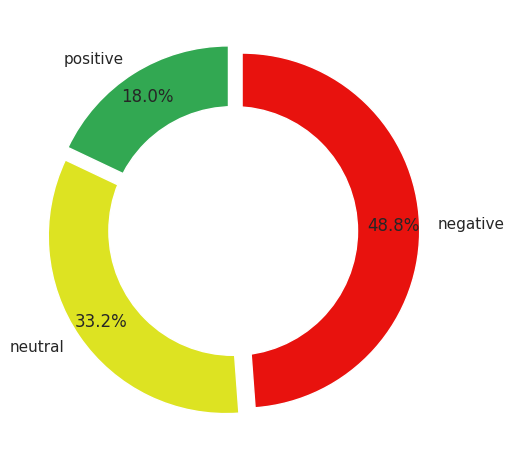

In [ ]:
# Explosion (a visual add-on for the piechart)
explode= [0.05] * len(ratios)

# Create the piechart using plotly pie()
plt.pie(ratios,
        colors = colors,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        pctdistance=0.85,
        explode = explode)


# Draw a circle in the middle of the piechart to create doughnut effect
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.tight_layout()

# Show the result
plt.show()

##### 2. Create wordclouds

In [ ]:
# Create subests from your dataset accordinng to the labels from your analysis
pos = ca_data[ca_data["xlm_roBERTa_sentiment"] == "positive"]
neu = ca_data[ca_data["xlm_roBERTa_sentiment"] == "neutral"]
neg = ca_data[ca_data["xlm_roBERTa_sentiment"] == "negative"]

In [ ]:
# Create a list of your subset datasets
subsets = [pos, neu, neg]

In [ ]:
# Create a list for the color schemes for the wordclouds
cmap = ["YlGn", "Blues", "Reds"]

# Create a list for the current names to be printed along with the wordclouds
names = ["Positive", "Neutral", "Negative"]

In [ ]:
# define basic set of stop words from wordcloud
stopwords = set(STOPWORDS)

# Add own stop words
stopwords.update(['https', 't', 'co', 's'])

Positive


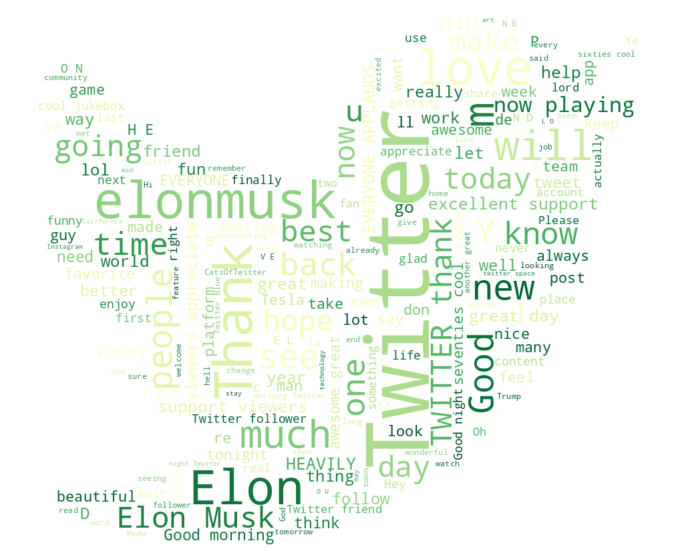

Neutral


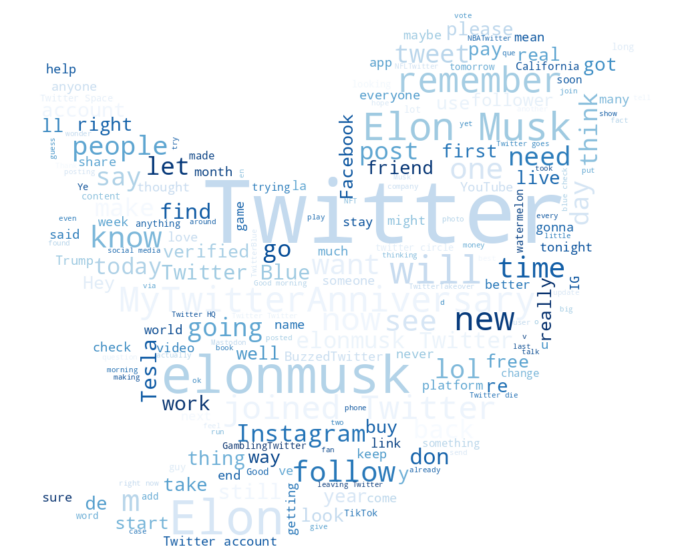

Negative


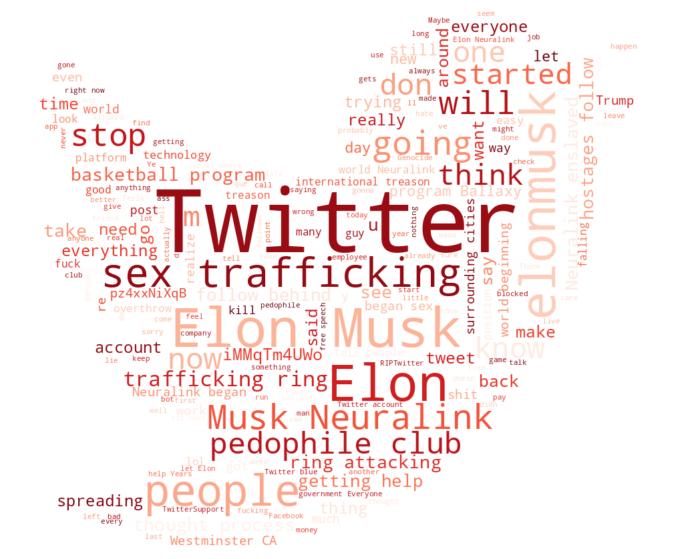

In [ ]:
# Format the wordclouds into a Twitter logo shape by using a PNG image of the logo
url = 'https://raw.githubusercontent.com/rasbt/datacollect/master/dataviz/twitter_cloud/twitter_mask.png'
response = requests.get(url)
mask = np.array(Image.open(BytesIO(response.content)))

# iterate over the cateogies to create and show a wordcloud
for i in range(len(subsets)):
    # show the name
    print(names[i])
    # define the text for the wordcloud
    text = " ".join(i for i in subsets[i].text)
    # create a wordcloud item using the wordcloud package
    wordcloud = WordCloud(stopwords=stopwords, mask=mask, background_color="white", colormap=cmap[i]).generate(text)
    # format the figure
    plt.figure( figsize=(10,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    # show the wordcloud
    plt.show()

##### 3. Inspect the data geographically

The data is inspected from a geographical perspective by creating a [```px.scatter_mapbox()```](https://plotly.github.io/plotly.py-docs/generated/plotly.express.scatter_mapbox.html) which allows for plotting of the data points and coloring them according to the analysis results.



In [ ]:
# Create a plotly mapbox map
# You can use the documentation as a guide to fill the parameters: https://plotly.github.io/plotly.py-docs/generated/plotly.express.scatter_mapbox.html
color_discrete_map = {"negative":"#E0340F", "neutral": "#FCF21E", "positive":"#58E230"}
fig = px.scatter_mapbox(data_frame = ca_data ,                # the dataset
                        lat = ca_data['lat'],                 # the column in the dataset indicating the latitude
                        lon = ca_data['lon'],                 # the column in the dataset indicating the longitude
                        color = ca_data["xlm_roBERTa_sentiment"],         # the column in the dataset by which the points should be colored
                        color_discrete_map  = color_discrete_map,    # changing the colors
                        center=dict(                                 # the lat and long coordinates that the map should center on
                                    lat = 37.37880757387082,
                                    lon= -120.39821885271604
                                ),
                        zoom = 5,                                    # the initial zoom-level of the map (higher numbers = more zoomed in)
                        mapbox_style = 'open-street-map',            # the style of the base map (e.g. 'carto-positron'), check documentation link to see other options
                        height = 800,                                 # height of the map figure in pixels (e.g. 600)
                        title = "California",
                        hover_data = {'lon': False,
                                      'lat': False,
                                      'sentiment': True,
                                      'text': True}
                        )
fig.show()

##### 4. Check the spatial distribution

In [ ]:
print(ca_data.crs)
ca_data = ca_data.set_crs('EPSG:4326')

ca_data.crs

None


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

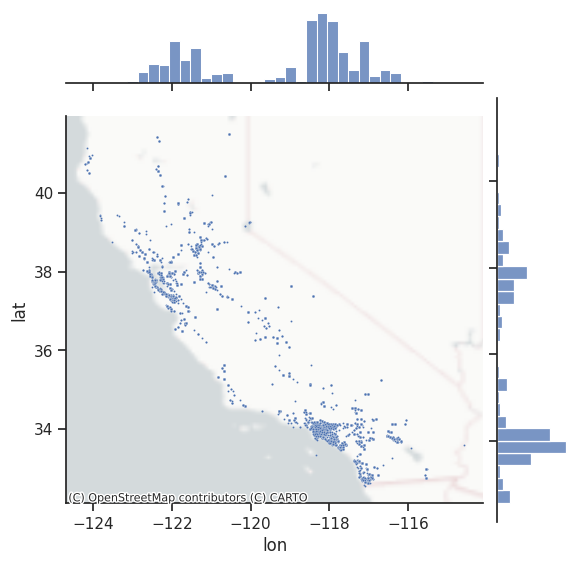

In [ ]:
# Generate a jointplot with a base map to show spatial distribution
joint_axes = sns.jointplot(                                   # The joinplot function creates a figure that has multiple subplots
    x= ca_data["lon"],                                        # Specify the longitude column of the dataset
    y=  ca_data["lat"],                                       # Specify the latitude column of the dataset
    data= ca_data,                                            # Specify the dataset to be plotted
    s= 2                                                      # Specify the size of the point markers (in numeric terms, e.g. 3)
)
contextily.add_basemap(                                       # Function for adding a basemap
    joint_axes.ax_joint,                                      # Join the basemap with the plot
    crs= 'EPSG:4326',                                         # Specify the coordinate reference system
    source=contextily.providers.CartoDB.PositronNoLabels,     # Style of the base map
    zoom = 4
)


Inspecting the results shows that a large amount of points at exactly the same location. Locations can be set through GNSS or set by users on their own. In the latter case, users often choose the general area, e.g. the city, from where they are tweeting. This results in points being at the exact same location defined as the center of the chosen city.

Having locations centered in a chosen city leads to wrong or unclear locations when looking at a smaller area, e.g. within a city. The location provided by setting it manually, creates blurry data which cannot give insights into specific distributions. Additionally, setting the location allows people outside the area to pretend to be tweeting from there. As a result, we receive wrong or useless data.

##### 5. Spatial Analysis

In [ ]:
# Split the GeoDataFrame into subsets based on the 'semantic_analysis' column values
pos = ca_data[ca_data["xlm_roBERTa_sentiment"] == "positive"]
neu = ca_data[ca_data["xlm_roBERTa_sentiment"] == "neutral"]
neg = ca_data[ca_data["xlm_roBERTa_sentiment"] == "negative"]

In [ ]:
# Create a list of the subset datasets
datasets = [pos, neu, neg]

# Create a list of the titles for each map
titles = ["Positive", "Neutral", "Negative"]

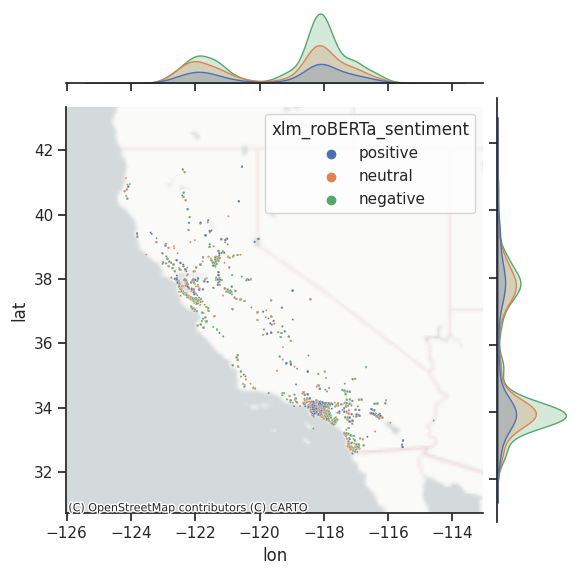

In [ ]:
# Generate a jointplot with a base map to show spatial distribution of tweets depending on the sentiment
joint_axes = sns.jointplot(                                    # Joinplot function creates a figure that has multiple subplots
    x = ca_data["lon"],                                        # Specify the longitude column of the dataset
    y =  ca_data["lat"],                                       # Specify the latitude column of the dataset
    data = ca_data,                                            # Specify the dataset to be plotted
    s = 2,                                                     # Specify the size of the point markers
    hue = 'xlm_roBERTa_sentiment'
)
contextily.add_basemap(                                        # Function for adding a basemap
    joint_axes.ax_joint,                                       # Join the basemap with the plot
    crs = 'EPSG:4326',                                          # Specify the coordinate reference system
    source = contextily.providers.CartoDB.PositronNoLabels,      # Style of the base map
    zoom = 4
)

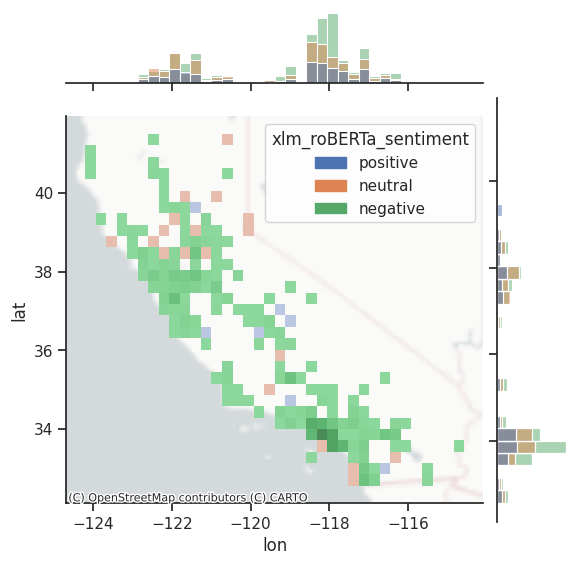

In [ ]:
# Generate another jointplot with a base map to show spatial distribution of tweets depending on the sentiment
joint_axes = sns.jointplot(
    x= ca_data["lon"],
    y=  ca_data["lat"],
    data= ca_data,
    hue= 'xlm_roBERTa_sentiment',
    kind = 'hist'
)
contextily.add_basemap(
    joint_axes.ax_joint,
    crs= 'EPSG:4326',
    source=contextily.providers.CartoDB.PositronNoLabels,
    zoom = 4
)

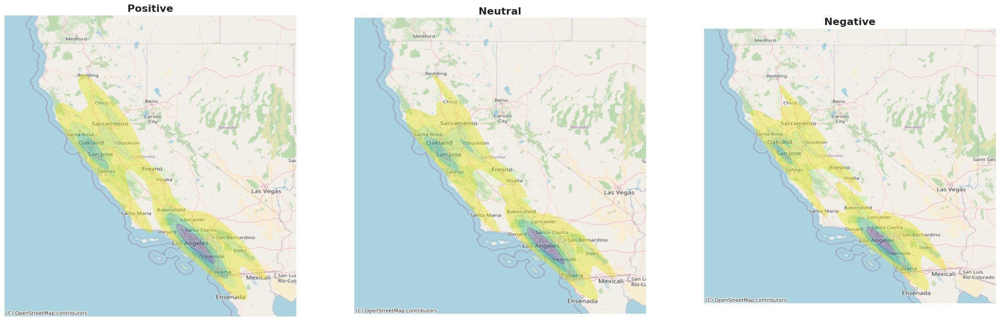

In [ ]:
# Specify the number of maps
nr_of_maps = 3

# Create a list of one's to make sure there's an equal size ratio between the maps
width_ratios = []
for i in range(nr_of_maps):
  width_ratios.append(1)

# Set up figure and axes
fig, axes = plt.subplots(1, nr_of_maps, figsize=(28, 13), gridspec_kw={'width_ratios': width_ratios})

# Create hotspot maps for each dataset
for i, ax in enumerate(axes):
    sns.kdeplot(
        data = datasets[i],                # Specify the current dataset to map
        x = datasets[i]["lon"],            # Specify the longitude columnn name
        y = datasets[i]["lat"],            # Specify the latitude column name
        n_levels = 5,                      # Specify how many different levels the hotspot map should show
        alpha = 0.40,                      # Set the transparency
        cmap = "viridis_r",                # Specify a color scheme
        fill = True,                       # Set the fill to 'True'
        ax = ax                            # Specify pre-exiting axes on which to plot the maps
    )
    # Add basemap
    contextily.add_basemap(
        ax,                               # Specify which axis to add the base map to
        crs = "WGS84",                    # Specify the coordinate reference system
        source=contextily.providers.OpenStreetMap.Mapnik     # Change the style of the base map
    )
    # Remove axes
    ax.set_axis_off()
    # Add title
    ax.set_title(titles[i], fontsize=16, fontweight='bold')

# Display the figures
plt.show()

# Save the figures
fig.savefig('hotspot_maps.png', dpi=300, bbox_inches='tight')


##### 6. Create a further map or plot showing your analysis results

In [ ]:
# Create datetime dtype for the date column
ca_data['date'] = pd.to_datetime(ca_data['date'])

# ca_data.dtypes
ca_data['hour'] = ca_data['date'].dt.ceil("H")

In [ ]:
ca_data.head(5)

,Unnamed: 0,date,text,sentiment,tweet_lang,user_id,followers,AREA,PERIMETER,STATESP020,...,STATE_FIPS,ORDER_ADM,MONTH_ADM,DAY_ADM,YEAR_ADM,geometry,lat,lon,xlm_roBERTa_sentiment,hour
0,0,2022-10-16 19:19:00,@mizzboothang78 @masikakalysha @Twitter You're...,positive,en,1.391820e+18,347,41.544,47.247,1730,...,6,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300425,positive,2022-10-16 20:00:00
1,1,2022-01-10 15:26:00,Good morning.Saturday twitter https://t.co/P5Y...,positive,en,1.299090e+18,18,41.544,47.247,1730,...,6,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300426,neutral,2022-01-10 16:00:00
2,2,2022-09-11 14:11:00,Good morning.twitter https://t.co/oI5TIsYR3V,positive,en,1.299090e+18,17,41.544,47.247,1730,...,6,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300426,neutral,2022-09-11 15:00:00
3,3,2022-09-11 18:49:00,@Shiba_King1991 @elonmusk So much knowledge he...,positive,en,1.460280e+18,1834,41.544,47.247,1730,...,6,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300426,positive,2022-09-11 19:00:00
4,4,2022-08-10 01:17:00,Shabbat Shalom Mijo. Shabbat Shalom Twitter Fr...,positive,en,1.447260e+18,887,41.544,47.247,1730,...,6,31,September,9,1850,POINT (-121.30043 37.98083),37.980826,-121.300426,positive,2022-08-10 02:00:00


In [ ]:
# Group times and sentiment
counts = ca_data.groupby(['hour', 'xlm_roBERTa_sentiment'])['xlm_roBERTa_sentiment'].count()
print(counts)

hour                 xlm_roBERTa_sentiment
2022-01-10 01:00:00  negative                 5
                     neutral                  4
                     positive                 1
2022-01-10 02:00:00  negative                 3
                     neutral                  1
                                             ..
2022-12-11 23:00:00  neutral                  5
                     positive                 2
2022-12-12 00:00:00  negative                 4
                     neutral                  2
                     positive                 3
Name: xlm_roBERTa_sentiment, Length: 3245, dtype: int64


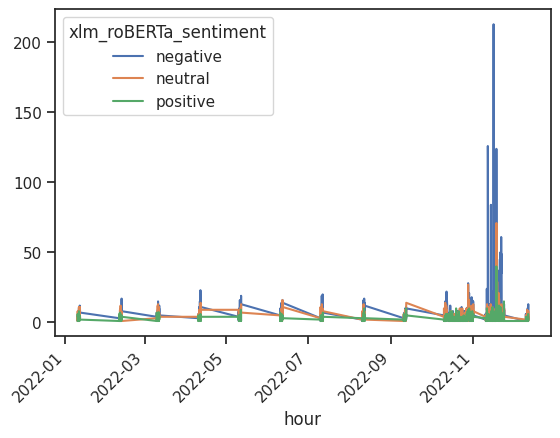

In [ ]:
# Plot the results
counts = counts.unstack()
counts.plot()
plt.xticks(rotation=45)
plt.show()

In [ ]:
counts = pd.DataFrame(counts)
for col in counts.columns:
    print(col)

counts.reset_index(inplace=True)

negative
neutral
positive


In [ ]:
# Reshape counts
counts = pd.melt(counts, id_vars = 'hour', value_vars=['negative', 'neutral', 'positive'], var_name = 'sentiment', value_name='count')
counts

,hour,sentiment,count
0,2022-01-10 01:00:00,negative,5.0
1,2022-01-10 02:00:00,negative,3.0
2,2022-01-10 03:00:00,negative,4.0
3,2022-01-10 04:00:00,negative,NaN
4,2022-01-10 05:00:00,negative,2.0
...,...,...,...
3697,2022-12-11 20:00:00,positive,3.0
3698,2022-12-11 21:00:00,positive,1.0
3699,2022-12-11 22:00:00,positive,2.0
3700,2022-12-11 23:00:00,positive,2.0


In [ ]:
# Plot the results
fig = px.line(counts, x='hour', y = 'count', color = 'sentiment', color_discrete_sequence=["red", "blue", "green"])
fig.show()

In the previous part we wanted to get a feeling about the sentiments of the tweets over time. In order to do that, we rounded the timestamps to the next full hour. After that, the dataset is grouped by the `hour` timestamp and by the model's assigned sentiment. The amount of tweets per group are counted.
This gives an overview of how often tweets of a certain sentiment were tweeted in an hour.

After changing a bit the structure of the dataset, we plotted the data as an interactive lineplot via plotly.

<br>

##Interpretation

### Visual Interpretation


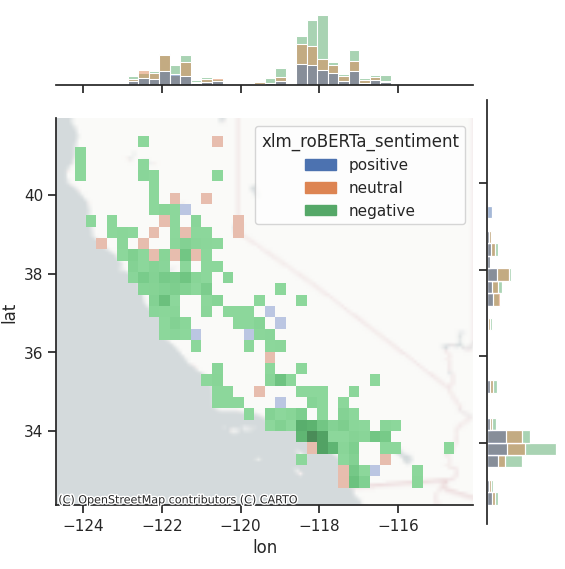

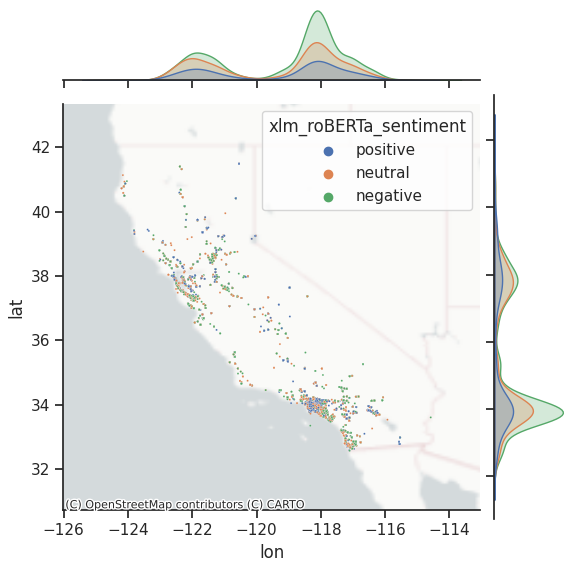

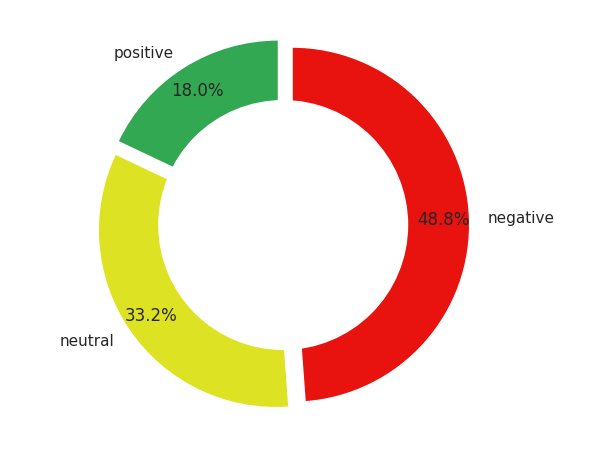


These plots visualize our results quite well. It is clearly visible, that negative tweets dominate this data set, especially in the big city of San Francisco where also the Twitter headquarters are located.
In the other other areas, where less tweets were posted, the differences in the distribution of tweets positive/neutral/negative sentiments are not as big as in San Francisco. Nonetheless, negative tweets always dominated the sentiment in the whole of California.



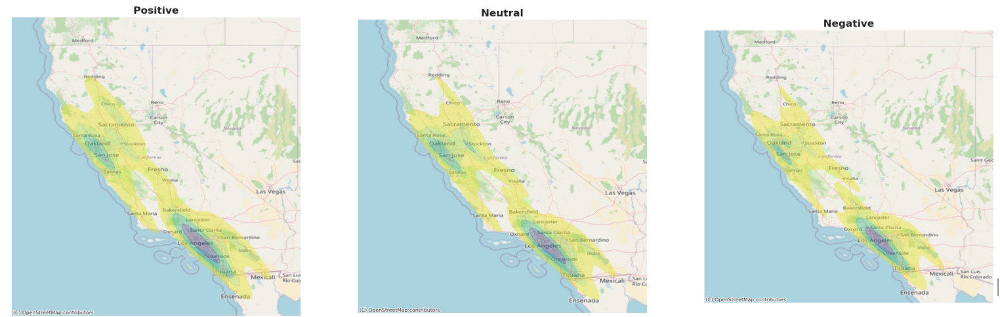


The three plots above show how many tweets of each sentiment were posted as a heatmap. This analysis shows that (as you would expect) most of the tweets of each sentiment were posted in the highly populated areas of California. In absolute numbers, most of the positive, most of the neutral, and most of the negative tweets were posted in and around Los Angeles. In these three plots, it is difficult to tell differences in the amount of positive versus negative tweets.
This is better showcased in the spatial distribution of the plot before.

To get rid of the effect of absolute numbers, for future analysis, it would be interesting to calculate the percentage values of positive/neutral/negative tweets per predefined grid cell and then compare how tweets differ relatively between positive, neutral, and negative sentiments in space. This would make the sentiment analysis more comparable between regions.

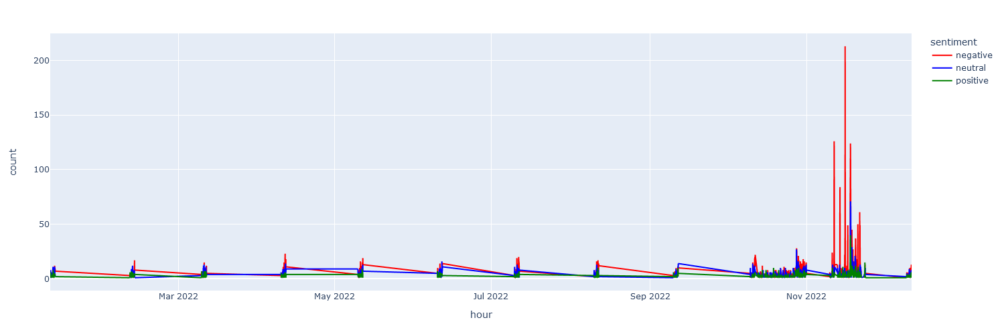

Inspecting the time series above reveals that our data is not evenly and continuously sampled over time. There are many gaps, where no tweets appear in our dataset. However, during the time when Elon Musk fired many Twitter employees, our time series is a bit more consistent and we can see large effects in the number of tweets in general. The ratio of negative to positive and neutral tweets is also especially skewed during this time. The lack of tweets prior to the takeover may also be due to the relevant keywords used to create the dataset not being used very frequently.

A further nice visualization may be to plot the percentage of negative tweets to the total number of tweets per hour. This would reflect the overall sentiment on Twitter over time quite well.





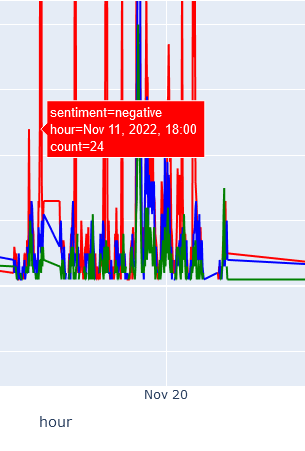

In the time series you can see, that also in "calm" times, negative tweets tend to be more frequent than neutral or positive tweets. But especially from the 11th of November negative tweets extremely exceed neutral and positive tweets. But also the number of tweets increased tremendously.

As a next step, it would be also nice to create animations that show the geographical sentiment distribution over time. Therefore maybe even more data would be needed per time interval (especially where there are gaps). This would give much better insights into how sentiments on Twitter changed over space and time.

Also, in order to underline our visualizations several statistical tests could be performed in order to quantify spatial and temporal differences and determine statistical significance.

### Accuracy Assessment

The quality of the model's sentiment assignment can be assessed by manual inspection. To do this, a sample of the classified tweets could be randomly extracted and assigned a positive, negative, or neutral value by human interpretation. These values would then be used as reference or "ground truth" data and compared to the model's class assignment. The more random samples in the reference set, the higher the significance of the results becomes. Depending on the scale, this could become quite time-consuming.

The code below demonstrates this for 50 random tweets.

In [ ]:
# Set random seed
np.random.seed(42)
# Create a reference set with 50 random tweets
reference_set = ca_data.sample(n=50)

In [ ]:
# Use only the tweets and their assigned sentiment value columns
reference_set = reference_set[["text", "xlm_roBERTa_sentiment"]]
reference_set

,text,xlm_roBERTa_sentiment
9044,#RaiderNation twitter is so toxic,negative
14052,"Twitter, its not the house of dragon, its ho...",neutral
11802,Do Twitter polls work anymore or do we need to...,neutral
13486,@qvrgss Rubbing it in like that is it very nic...,negative
3999,"@julie_kelly2 ""No more basketball."" \n\n-#Neur...",negative
4894,@JackPosobiec Oh hell no. Elon's picks might n...,negative
15309,cohost is a great alternative to twitter so fa...,negative
15804,What special perks do you guys want to see in ...,neutral
8104,Twitter is doing a Fortnite 2.0 experience shu...,neutral
1302,Grabbed lunch at #Twitter today!?? \nI could s...,neutral


In [ ]:
# Insert a new column with the human interpreted values
reference_set["human_sentiment"] = [
    "negative",
    "neutral",
    "negative",
    "negative",
    "negative",
    "negative",
    "neutral",
    "neutral",
    "neutral",
    "neutral",
    "negative",
    "positive",
    "neutral",
    "negative",
    "neutral",
    "positive",
    "neutral",
    "negative",
    "neutral",
    "negative",
    "negative",
    "neutral",
    "negative",
    "negative",
    "negative",
    "neutral",
    "negative",
    "negative",
    "neutral",
    "negative",
    "positive",
    "neutral",
    "negative",
    "negative",
    "negative",
    "negative",
    "neutral",
    "neutral",
    "neutral",
    "neutral",
    "negative",
    "neutral",
    "negative",
    "neutral",
    "negative",
    "neutral",
    "negative",
    "neutral",
    "neutral",
    "negative"
 ]
reference_set

,text,xlm_roBERTa_sentiment,human_sentiment
9044,#RaiderNation twitter is so toxic,negative,negative
14052,"Twitter, its not the house of dragon, its ho...",neutral,neutral
11802,Do Twitter polls work anymore or do we need to...,neutral,negative
13486,@qvrgss Rubbing it in like that is it very nic...,negative,negative
3999,"@julie_kelly2 ""No more basketball."" \n\n-#Neur...",negative,negative
4894,@JackPosobiec Oh hell no. Elon's picks might n...,negative,negative
15309,cohost is a great alternative to twitter so fa...,negative,neutral
15804,What special perks do you guys want to see in ...,neutral,neutral
8104,Twitter is doing a Fortnite 2.0 experience shu...,neutral,neutral
1302,Grabbed lunch at #Twitter today!?? \nI could s...,neutral,neutral


The reference set above tries to classify the sentiment of each overall tweet and not the sentiment specifically toward the takeover, as this is the same as what the model evaluates. For example, the sentiment of the following tweet is negative despite the user probably approving of the takeover.
> @stillgray @mirandadevine What are you gonna do about it? There's not a damn thing. You can do about Twitter. Now that it's owned by a free speech guy. You Dems in lives are super crybabies. Embarrassments really. But I like watching you act stupid. It's amusing.

In [ ]:
# Compute a confusion matrix
confusion_matrix = pd.crosstab(reference_set["human_sentiment"], reference_set["xlm_roBERTa_sentiment"], rownames=['Human Sentiment'], colnames=['Model Sentiment'])
confusion_matrix

Model Sentiment,negative,neutral,positive
Human Sentiment,,,
negative,22,2,1
neutral,4,15,3
positive,0,0,3


In [ ]:
from sklearn.metrics import accuracy_score

# Compute the accuracy (correct model classifications / total tweets in the set)
reference_set_acc = accuracy_score(reference_set["human_sentiment"], reference_set["xlm_roBERTa_sentiment"])
print("Accuracy:", reference_set_acc)

Accuracy: 0.8


To make the result more objective, a large group of people could come to a consensus for each tweet's sentiment.

Another approach to assess the accuracy may be to compare the results to another method with known accuracy (not feasible for this assignment).

### Model Suitability

The [model we chose](https://huggingface.co/cardiffnlp/twitter-xlm-roberta-base-sentiment) is successfully able to classify the large amounts of tweets provided to it. The model uses an XLM-RoBERTa (multilingual version of RoBERTa) base and is finetuned for Twitter sentiment analysis. These promising factors translate well into our results. The accuracy assessment performed (with a low amount of samples and subjective human interpretation) yields an overall accuracy of 80% of tweet sentiments correctly classified. This may not seem very high. However, given the many challenges still facing NLP, the results are quite good. Such challenges include understanding sarcasm and irony, correctly interpreting mistakes or slang, or accounting for broader context. A large part of model performance may also be decided by subjective interpretation. Overall, we think that the model did a good job of assigning sentiments and the results reflect our overall perception of the Twitter takeover discourse in California.